# Project Overview

## Aim: 
To predict Gender, Age and Ethnicity from the UTKFace dataset. Available here: https://susanqq.github.io/UTKFace/?ssp=1&darkschemeovr=0&setlang=en-GB&safesearch=moderate

### Dataset Description
- The dataset consists of  20k+ face images in the wild (only single face in one image)
- The images in the dataset are labelled by age, gender, and ethnicity
- For the labels, the age is an integer from 0 to 116; the gender is either 0 (male) or 1 (female) and the ethnicity is an integer from 0 to 4, denoting White, Black, Asian, Indian, and Others (like Hispanic, Latino, Middle Eastern).

## Project Structure
- Libraries import: Import the necessary libraries
- Data loading and cleaning
- Data Exploration 
- Model development
- Conclusion 

## Import libraries

In [ ]:
# required libraries: Numpy, Pandas, TensorFlow, matplotlib, seaborn, sklearn
import numpy as np 
import pandas as pd
import tensorflow as tf
from tensorflow.keras import layers
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn import metrics
from imblearn.over_sampling import SMOTE

## Data Loading
- The CSV file provided by Kaggle had the pixels already processed, saving us with the processing step
- The only thing required is to make the items in the pixels column in a list. We can split the string by the empty space to make it a list

In [ ]:
# use pandas to load the CSV file
data = pd.read_csv('age_gender.csv')
data.head()

,age,ethnicity,gender,img_name,pixels
0,1,2,0,20161219203650636.jpg.chip.jpg,129 128 128 126 127 130 133 135 139 142 145 14...
1,1,2,0,20161219222752047.jpg.chip.jpg,164 74 111 168 169 171 175 182 184 188 193 199...
2,1,2,0,20161219222832191.jpg.chip.jpg,67 70 71 70 69 67 70 79 90 103 116 132 145 155...
3,1,2,0,20161220144911423.jpg.chip.jpg,193 197 198 200 199 200 202 203 204 205 208 21...
4,1,2,0,20161220144914327.jpg.chip.jpg,202 205 209 210 209 209 210 211 212 214 218 21...


In [ ]:
# convert the pixels separated by spaces into numpy array & convert the data type to float32 and store it in the same column
data['pixels']= data['pixels'].apply(lambda x:  np.array(x.split(), dtype="float32"))

data.head()

,age,ethnicity,gender,img_name,pixels
0,1,2,0,20161219203650636.jpg.chip.jpg,"[129.0, 128.0, 128.0, 126.0, 127.0, 130.0, 133..."
1,1,2,0,20161219222752047.jpg.chip.jpg,"[164.0, 74.0, 111.0, 168.0, 169.0, 171.0, 175...."
2,1,2,0,20161219222832191.jpg.chip.jpg,"[67.0, 70.0, 71.0, 70.0, 69.0, 67.0, 70.0, 79...."
3,1,2,0,20161220144911423.jpg.chip.jpg,"[193.0, 197.0, 198.0, 200.0, 199.0, 200.0, 202..."
4,1,2,0,20161220144914327.jpg.chip.jpg,"[202.0, 205.0, 209.0, 210.0, 209.0, 209.0, 210..."


In [ ]:
# we check the number of rows and columns in the dataset
# we have 23705 rows and 5 columns
data.shape

(23705, 5)

In [ ]:
# normalise the pixels in the pixels column
data['pixels'] = data['pixels'].apply(lambda x: x/255)
data.head()

,age,ethnicity,gender,img_name,pixels
0,1,2,0,20161219203650636.jpg.chip.jpg,"[0.5058824, 0.5019608, 0.5019608, 0.49411765, ..."
1,1,2,0,20161219222752047.jpg.chip.jpg,"[0.6431373, 0.2901961, 0.43529412, 0.65882355,..."
2,1,2,0,20161219222832191.jpg.chip.jpg,"[0.2627451, 0.27450982, 0.2784314, 0.27450982,..."
3,1,2,0,20161220144911423.jpg.chip.jpg,"[0.75686276, 0.77254903, 0.7764706, 0.78431374..."
4,1,2,0,20161220144914327.jpg.chip.jpg,"[0.7921569, 0.8039216, 0.81960785, 0.8235294, ..."


# Data Exploration
- understand the distribution in the labels

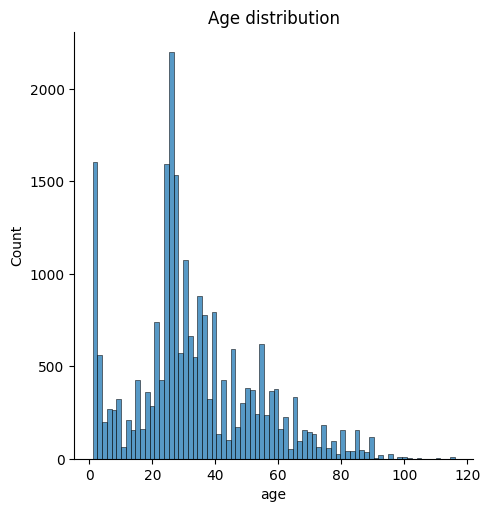

In [ ]:
sns.displot(data['age']);
plt.title("Age distribution");

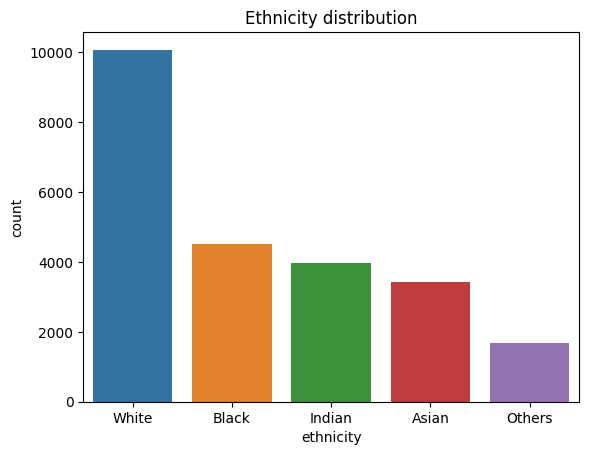

In [ ]:
# plot the count of each group in the ethnicity column
ethnicity_vals = data['ethnicity'].value_counts() \
                 .to_frame().reset_index() \
                 .rename(columns={"ethnicity": "count", "index":"ethnicity"})
ethnicity_vals["ethnicity"] = ethnicity_vals["ethnicity"].map({0: "White", 1: "Black", 2: "Asian", 3: "Indian", 4: "Others"})

sns.barplot(ethnicity_vals, x="ethnicity", y="count");
plt.title("Ethnicity distribution");

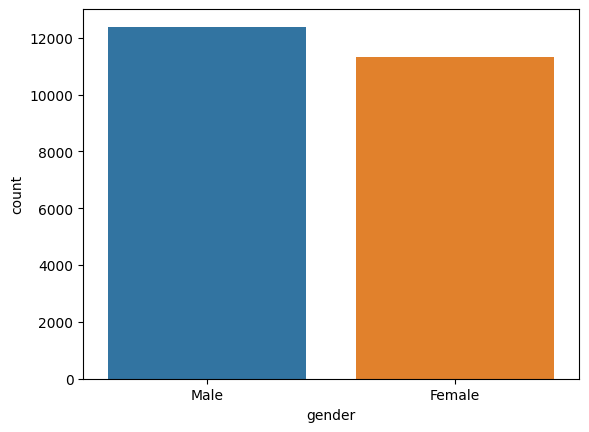

In [ ]:
# plot the count of male and female in the gender column
gender_counts = data['gender'].value_counts() \
                .rename(index={0:'Male',1:'Female'}).to_frame().reset_index() \
                .rename(columns={"index": "gender", "gender": "count"})

sns.barplot(gender_counts, x="gender", y="count");

In [ ]:
# feature selection, we grab the pixels column and store it in X as inputs
# convert the pixels from 1D to 3D
X = np.array(data['pixels'].tolist())
X = X.reshape(X.shape[0], 48, 48, 1)

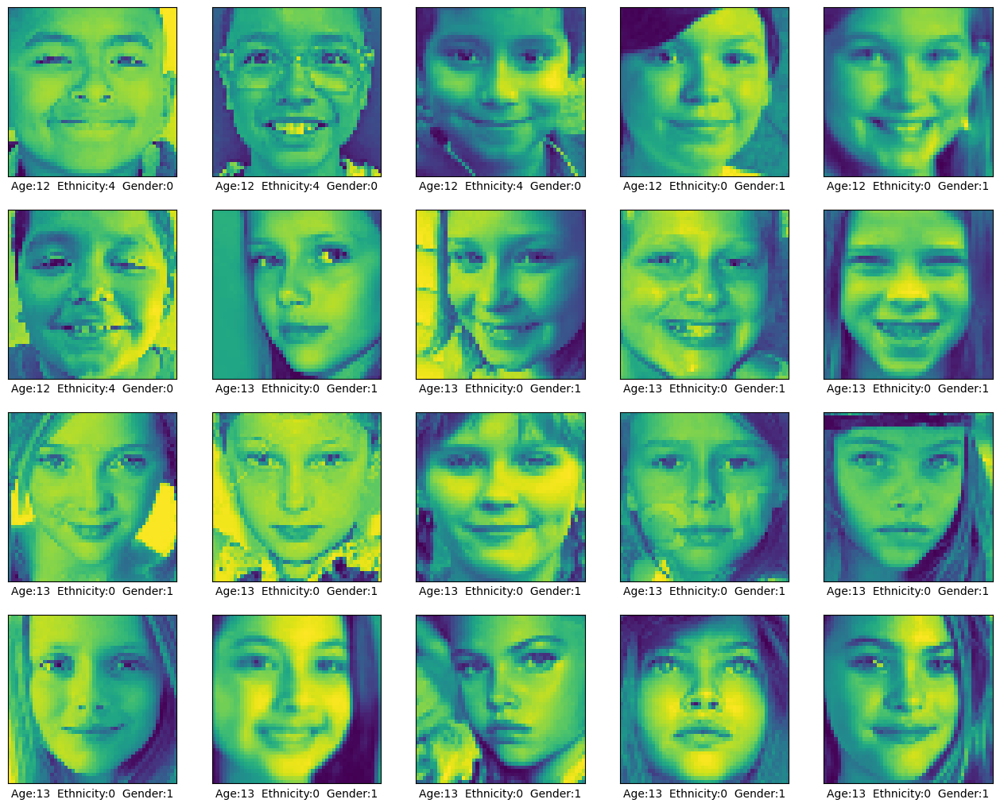

In [ ]:
# preview the pixels in 3D
plt.figure(figsize=(16,16))

for i in range(1500, 1520):
    plt.subplot(5, 5, (i%25) + 1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(data['pixels'].iloc[i].reshape(48,48))
    plt.xlabel(
        "Age:"+str(data['age'].iloc[i])+
        "  Ethnicity:"+str(data['ethnicity'].iloc[i])+
        "  Gender:"+ str(data['gender'].iloc[i])
    )
plt.show()

## Model Development
A model using TensorFlow would be developed for Gender, Ethnicity and Age

### Gender Model
- Features and Target selection and data split
- split data into 30% test and 70% training

In [ ]:
y = data['gender']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.30, random_state=37, stratify=y)


In [ ]:
gender_model = tf.keras.Sequential([
    layers.InputLayer(input_shape=(48, 48, 1)),
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(32, 32, 3)),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dropout(rate=0.5),
    layers.Dense(1, activation='sigmoid')
])

gender_model.compile(optimizer='sgd',
              loss=tf.keras.losses.BinaryCrossentropy(),
              metrics=['accuracy'])


class KerasCallbackCriterion(tf.keras.callbacks.Callback):
    """sop training when validation loss reach 0.2700 """
    def on_epoch_end(self, epoch, logs={}):
        if(logs.get('val_loss') < 0.2700):
            print("\nReached 0.2700 val_loss so cancelling training!")
            self.model.stop_training = True
        
callback = KerasCallbackCriterion()

gender_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 46, 46, 32)        320       
_________________________________________________________________
batch_normalization (BatchNo (None, 46, 46, 32)        128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 23, 23, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 21, 21, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 10, 10, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 6400)              0         
_________________________________________________________________
dense (Dense)                (None, 64)                4

In [ ]:
history = gender_model.fit(
    X_train, y_train, epochs=20, validation_split=0.1, batch_size=64, callbacks=[callback]
)

Epoch 1/20
234/234 [==============================] - 8s 17ms/step - loss: 0.5436 - accuracy: 0.7240 - val_loss: 0.6118 - val_accuracy: 0.8151
Epoch 2/20
234/234 [==============================] - 3s 12ms/step - loss: 0.4142 - accuracy: 0.8110 - val_loss: 0.4320 - val_accuracy: 0.8440
Epoch 3/20
234/234 [==============================] - 3s 12ms/step - loss: 0.3631 - accuracy: 0.8375 - val_loss: 0.3576 - val_accuracy: 0.8470
Epoch 4/20
234/234 [==============================] - 3s 12ms/step - loss: 0.3387 - accuracy: 0.8495 - val_loss: 0.3114 - val_accuracy: 0.8584
Epoch 5/20
234/234 [==============================] - 3s 11ms/step - loss: 0.3216 - accuracy: 0.8580 - val_loss: 0.3046 - val_accuracy: 0.8681
Epoch 6/20
234/234 [==============================] - 3s 12ms/step - loss: 0.3060 - accuracy: 0.8665 - val_loss: 0.2983 - val_accuracy: 0.8729
Epoch 7/20
234/234 [==============================] - 3s 11ms/step - loss: 0.2969 - accuracy: 0.8746 - val_loss: 0.2902 - val_accuracy: 0.8777

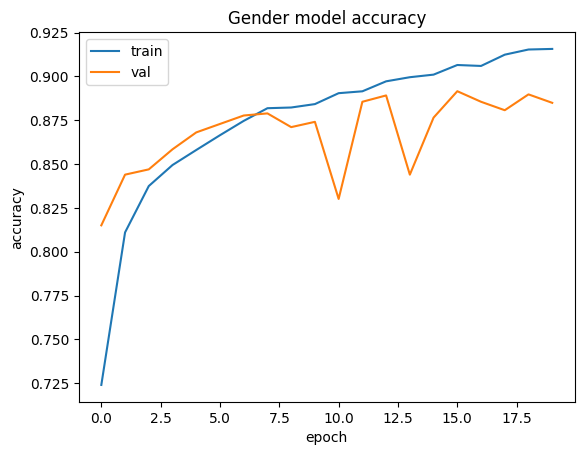

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Gender model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

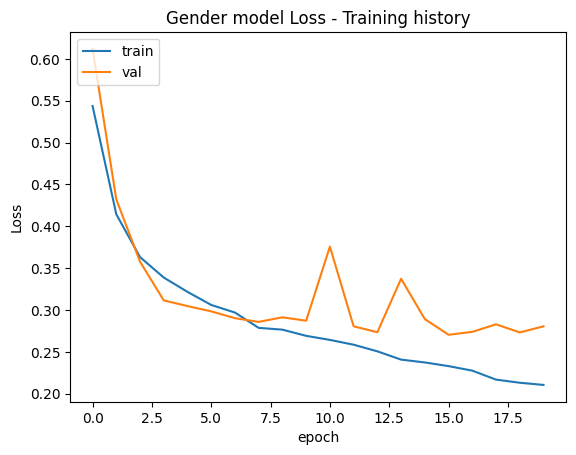

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Gender model Loss - Training history')
plt.ylabel('Loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [ ]:
gender_model_loss, gender_model_accuracy = gender_model.evaluate(X_test,y_test,verbose=0)
print("Model Loss: ", gender_model_loss)
print("Model Accuracy: ", gender_model_accuracy)

Model Loss:  0.26356807351112366
Model Accuracy:  0.8835770487785339


In [ ]:
y_pred = gender_model.predict(X_test, batch_size=64, verbose=1)
y_pred = np.where(y_pred > 0.7, 1, 0).flatten()

print(metrics.classification_report(y_test.values, y_pred))

112/112 [==============================] - 1s 4ms/step
              precision    recall  f1-score   support

           0       0.79      0.98      0.87      3718
           1       0.97      0.71      0.82      3394

    accuracy                           0.85      7112
   macro avg       0.88      0.84      0.84      7112
weighted avg       0.87      0.85      0.85      7112



### Ethnicity Model
- Features and Target selection and data split
- split data into 30% test and 70% training

In [ ]:
y = data['ethnicity']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.30, random_state=37, stratify=y)

In [ ]:
ethnicity_model = tf.keras.Sequential([
    layers.InputLayer(input_shape=(48,48,1)),
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(32, 32, 3)),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dropout(rate=0.5),
    layers.Dense(5)
])

ethnicity_model.compile(optimizer='rmsprop',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])


class ModelStoppingCriteria(tf.keras.callbacks.Callback):
    """stop training when validation accuracy reach 80% """
    def on_epoch_end(self, epoch, logs={}):
        if(logs.get('val_accuracy')>0.80):
            print("\nReached 80% val_accuracy so cancelling training!")
            self.model.stop_training = True
        
callback = ModelStoppingCriteria()

ethnicity_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 46, 46, 32)        320       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 23, 23, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 21, 21, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 10, 10, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 6400)              0         
_________________________________________________________________
dense (Dense)                (None, 64)                409664    
_________________________________________________________________
dropout (Dropout)            (None, 64)                0

In [ ]:
history = ethnicity_model.fit(
    X_train, y_train, epochs=16, validation_split=0.1, batch_size=64, callbacks=[callback]
)

Epoch 1/16
234/234 [==============================] - 4s 14ms/step - loss: 1.2966 - accuracy: 0.4981 - val_loss: 1.0742 - val_accuracy: 0.6157
Epoch 2/16
234/234 [==============================] - 3s 13ms/step - loss: 1.0373 - accuracy: 0.6201 - val_loss: 0.9676 - val_accuracy: 0.6361
Epoch 3/16
234/234 [==============================] - 3s 12ms/step - loss: 0.9382 - accuracy: 0.6685 - val_loss: 0.8251 - val_accuracy: 0.7187
Epoch 4/16
234/234 [==============================] - 3s 14ms/step - loss: 0.8742 - accuracy: 0.6991 - val_loss: 0.8085 - val_accuracy: 0.7271
Epoch 5/16
234/234 [==============================] - 3s 12ms/step - loss: 0.8271 - accuracy: 0.7153 - val_loss: 0.7738 - val_accuracy: 0.7301
Epoch 6/16
234/234 [==============================] - 3s 12ms/step - loss: 0.7913 - accuracy: 0.7251 - val_loss: 0.7789 - val_accuracy: 0.7355
Epoch 7/16
234/234 [==============================] - 3s 12ms/step - loss: 0.7548 - accuracy: 0.7400 - val_loss: 0.7615 - val_accuracy: 0.7416

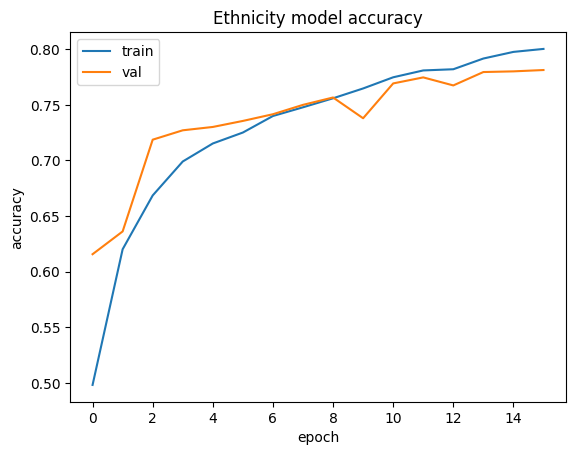

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Ethnicity model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

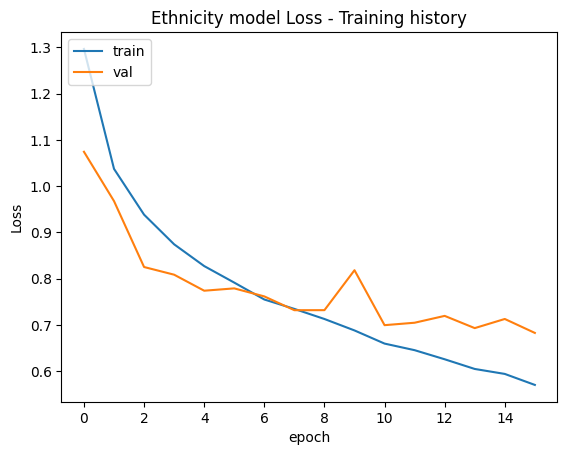

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Ethnicity model Loss - Training history')
plt.ylabel('Loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [ ]:
ethnicity_model_loss, ethnicity_model_accuracy = ethnicity_model.evaluate(X_test, y_test, verbose=0)
print("Model Loss: ", ethnicity_model_loss)
print("Model Accuracy: ", ethnicity_model_accuracy)

Model Loss:  0.6349948048591614
Model Accuracy:  0.7837457656860352


In [ ]:
y_pred = ethnicity_model.predict(X_test, batch_size=64, verbose=1)
y_pred = np.argmax(y_pred, axis=1)

print(metrics.classification_report(y_test.values, y_pred))

112/112 [==============================] - 1s 4ms/step
              precision    recall  f1-score   support

           0       0.81      0.85      0.83      3024
           1       0.85      0.82      0.84      1358
           2       0.81      0.84      0.83      1030
           3       0.67      0.78      0.72      1192
           4       0.47      0.15      0.22       508

    accuracy                           0.78      7112
   macro avg       0.72      0.69      0.69      7112
weighted avg       0.77      0.78      0.77      7112



## Oversample the minority class for the Ethnicity group

In [ ]:
smote = SMOTE(random_state=37)

X_resampled, y_resampled = smote.fit_resample(X.reshape(X.shape[0], -1), y)

X_resampled = X_resampled.reshape(-1, 48, 48, 1)

X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.30, random_state=37, stratify=y_resampled)


In [ ]:
history = ethnicity_model.fit(
    X_train, y_train, epochs=16, validation_split=0.1, batch_size=64, callbacks=[callback]
)

Epoch 1/16
497/497 [==============================] - 10s 20ms/step - loss: 0.5549 - accuracy: 0.8134 - val_loss: 0.5523 - val_accuracy: 0.8262

Reached 80% val_accuracy so cancelling training!


In [ ]:
y_pred = ethnicity_model.predict(X_test, batch_size=64, verbose=1)
y_pred = np.argmax(y_pred, axis=1)

print(metrics.classification_report(y_test.values, y_pred))

237/237 [==============================] - 2s 6ms/step
              precision    recall  f1-score   support

           0       0.66      0.85      0.74      3024
           1       0.91      0.86      0.88      3023
           2       0.92      0.90      0.91      3023
           3       0.89      0.74      0.81      3024
           4       0.72      0.71      0.72      3023

    accuracy                           0.81     15117
   macro avg       0.82      0.81      0.81     15117
weighted avg       0.82      0.81      0.81     15117



In [ ]:
ethnicity_model_loss, ethnicity_model_accuracy = ethnicity_model.evaluate(X_test, y_test, verbose=0)
print("Model Loss: ", ethnicity_model_loss)
print("Model Accuracy: ", ethnicity_model_accuracy)

Model Loss:  0.5874669551849365
Model Accuracy:  0.8104121088981628


### Age Model
- Features and Target selection and data split
- split data into 30% test and 70% training

In [ ]:
y = data['age']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.30, random_state=37
)

In [ ]:
age_model = tf.keras.Sequential([
    layers.InputLayer(input_shape=(48,48,1)),
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(32, 32, 3)),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dropout(rate=0.5),
    layers.Dense(1, activation='relu')
])

sgd = tf.keras.optimizers.SGD(momentum=0.9)

age_model.compile(optimizer='adam',
              loss='mean_squared_error',
              metrics=['mae'])



class AgeModelStoppingCriteria(tf.keras.callbacks.Callback):
    """stop training when validation loss reach 110 """
    def on_epoch_end(self, epoch, logs={}):
        if(logs.get('val_loss')<110):
            print("\nReached 110 val_loss so cancelling training!")
            self.model.stop_training = True
        
callback = AgeModelStoppingCriteria()


age_model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 46, 46, 32)        320       
_________________________________________________________________
batch_normalization_1 (Batch (None, 46, 46, 32)        128       
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 23, 23, 32)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 21, 21, 64)        18496     
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 10, 10, 64)        0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 8, 8, 128)         73856     
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 4, 4, 128)        

In [ ]:
history = age_model.fit(
    X_train, y_train, epochs=20, validation_split=0.1, batch_size=64, callbacks=[callback]
)

Epoch 1/20
234/234 [==============================] - 5s 16ms/step - loss: 366.8287 - mae: 14.6462 - val_loss: 1198.6929 - val_mae: 29.0149
Epoch 2/20
234/234 [==============================] - 3s 14ms/step - loss: 217.6576 - mae: 11.1404 - val_loss: 605.9298 - val_mae: 19.3092
Epoch 3/20
234/234 [==============================] - 4s 18ms/step - loss: 188.4642 - mae: 10.2849 - val_loss: 154.5496 - val_mae: 9.0513
Epoch 4/20
234/234 [==============================] - 4s 15ms/step - loss: 176.2861 - mae: 9.8481 - val_loss: 128.6819 - val_mae: 8.2552
Epoch 5/20
234/234 [==============================] - 3s 14ms/step - loss: 157.4690 - mae: 9.3138 - val_loss: 122.1769 - val_mae: 8.1954
Epoch 6/20
234/234 [==============================] - 3s 15ms/step - loss: 150.3174 - mae: 9.0556 - val_loss: 156.7603 - val_mae: 9.0309
Epoch 7/20
234/234 [==============================] - 4s 17ms/step - loss: 144.9136 - mae: 8.8938 - val_loss: 106.2578 - val_mae: 7.8622

Reached 110 val_loss so cancelling

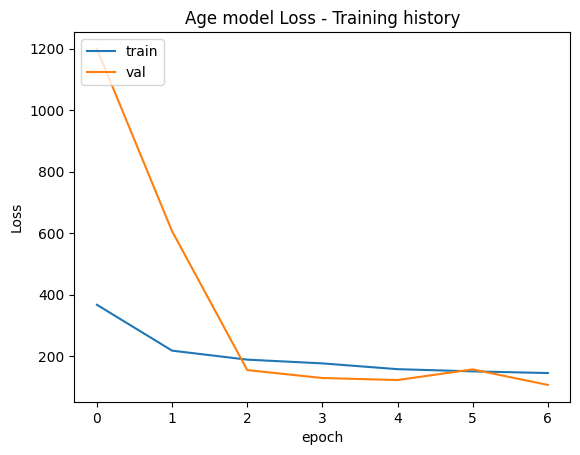

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Age model Loss - Training history')
plt.ylabel('Loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()


In [ ]:
y_pred = age_model.predict(X_test, batch_size=64, verbose=1)

112/112 [==============================] - 1s 8ms/step


In [ ]:
y_pred.flatten()

array([25.803791, 36.2762  , 26.514864, ..., 73.22034 , 66.119125,
       52.650597], dtype=float32)

In [ ]:
metrics.mean_absolute_error(y_test, y_pred.flatten())

7.671878901296646

In [ ]:
metrics.mean_squared_error(y_test, y_pred.flatten())

102.4104794337807

TRANSFER LEARNING USING VGG16

In [ ]:
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load
# Input data files are available in the read-only "../input/" directory
#/kaggle/input/utk-face-cropped/utkcropped/

In [ ]:
# required libraries: Numpy, Pandas, TensorFlow, matplotlib, seaborn, sklearn
import numpy as np 
import pandas as pd
import tensorflow as tf
from tensorflow.keras import layers
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn import metrics

from keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report,confusion_matrix
from keras.callbacks import ReduceLROnPlateau

from PIL import Image #Python Imaging Library

from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Dropout, Flatten, Reshape, MaxPool2D,BatchNormalization
from tensorflow.keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, EarlyStopping

'''from imblearn.over_sampling import SMOTE'''

'from imblearn.over_sampling import SMOTE'

In [ ]:
# use pandas to load the RGB CSV file
df = pd.read_csv('/kaggle/input/age-gender-and-ethnicity-face-data-csv/age_gender.csv')
df.head()

,age,ethnicity,gender,img_name,pixels
0,1,2,0,20161219203650636.jpg.chip.jpg,129 128 128 126 127 130 133 135 139 142 145 14...
1,1,2,0,20161219222752047.jpg.chip.jpg,164 74 111 168 169 171 175 182 184 188 193 199...
2,1,2,0,20161219222832191.jpg.chip.jpg,67 70 71 70 69 67 70 79 90 103 116 132 145 155...
3,1,2,0,20161220144911423.jpg.chip.jpg,193 197 198 200 199 200 202 203 204 205 208 21...
4,1,2,0,20161220144914327.jpg.chip.jpg,202 205 209 210 209 209 210 211 212 214 218 21...


**Preprocessing data**

In [ ]:
df['img_name'] = "/kaggle/input/utk-face-cropped/utkcropped/" + (df['age'].astype(str))+"_"+ (df['gender'].astype(str))+ "_"+ (df['ethnicity'].astype(str)) + "_" + df['img_name'] 

In [ ]:
def train_model(model, train_generator, validation_generator, epochs,name):
  

  path_cp = name + '_weights.hdf5'

  rlr = ReduceLROnPlateau(monitor = 'val_loss', factor = 0.1, patience = 6, verbose = 1, 
                                min_delta = 1e-4, min_lr = 1e-4, mode = 'min', cooldown=1)
        
  ckp = ModelCheckpoint(path_cp,monitor = 'val_loss',
                      verbose = 1, save_best_only = True, mode = 'min')
        
  es = EarlyStopping(monitor = 'val_loss', min_delta = 1e-4, patience = 15,mode = 'min', restore_best_weights = True, verbose = 1)
  
  # Fitting the model
  history = model.fit(train_generator,
                      epochs = epochs, 
                      validation_data = validation_generator, 
                      verbose = 1,
                      callbacks = [rlr,es,ckp])
  
  return history

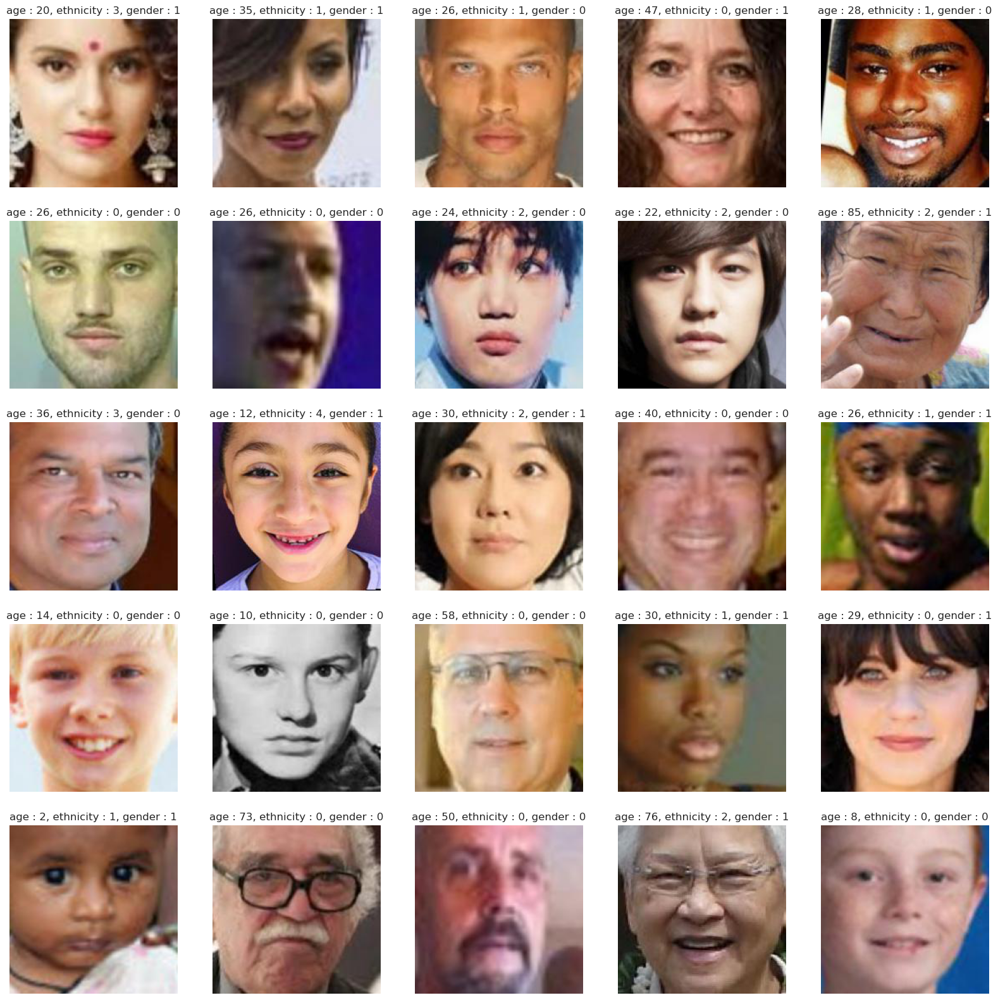

In [ ]:
# Randomly select 25 rows
selected_rows = df.sample(n=25)

# Create a 5x5 subplot grid
fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(20, 20))

# Loop through each axis and plot an image
for ax, row in zip(axs.flat, selected_rows.itertuples()):
    # Load the image using Pillow library
    img = Image.open(row.img_name)
    # Set the title of the subplot to the label
    ax.set_title(f"age : {row.age}, ethnicity : {row.ethnicity}, gender : {row.gender}")
    # Remove the x and y axis labels and ticks
    ax.set_xticks([])
    ax.set_yticks([])
    ax.axis('off')
    # Plot the image
    ax.imshow(img)

# Display the subplots
plt.show()

**GENDER MODEL**

In [ ]:
y = df[['gender']]
X = df[['img_name']]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)


In [ ]:
df_train = pd.concat([X_train,y_train],axis=1)
df_test = pd.concat([X_test,y_test],axis=1)

In [ ]:
def get_generator(df_test,df_train, x_col, y_cols, sample_size=100, batch_size=64, seed=1, target_w = 200, target_h = 200):
    
    print("getting testing generators...")
    
    # use sample to fit mean and std for test set generator
    train_image_generator = ImageDataGenerator(rescale=1/255,
                                               shear_range=0.2,
                                               zoom_range=0.3,
                                               rotation_range=10,
                                             width_shift_range=0.1,
                                             height_shift_range=0.1)
                                               
    
    test_image_generator = ImageDataGenerator(rescale=1/255)
    
    train_generator = train_image_generator.flow_from_dataframe(
            dataframe=df_train,
            x_col=x_col,
            y_col=y_cols,
            class_mode="raw",
            batch_size=batch_size,
            seed=seed,
            target_size=(target_w,target_h))
    
    test_generator = test_image_generator.flow_from_dataframe(
            dataframe=df_test,
            x_col=x_col,
            y_col=y_cols,
            class_mode="raw",
            batch_size=batch_size,
            shuffle=False,
            seed=seed,
            target_size=(target_w,target_h))
    
    return train_generator,test_generator

In [ ]:
train_generator, test_generator= get_generator(df_test,df_train,"img_name", "gender")

getting testing generators...
Found 18964 validated image filenames.
Found 4741 validated image filenames.


In [ ]:
from tensorflow.keras.applications.vgg16 import VGG16

model_train = VGG16(input_shape=(200,200,3) , weights='imagenet', include_top=False)

for layer in model_train.layers:
    layer.trainable = False

x = Reshape((6*6,512))(model_train.output)
x = Flatten()(x)
x = Dense(256)(x)
x = Dropout(0.2)(x)
x = Dense(64)(x)
prediction = Dense(2, activation='softmax')(x)

# create a model object
model4 = Model(inputs=model_train.input, outputs=prediction)

In [ ]:
model4.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 200, 200, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 200, 200, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 200, 200, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 100, 100, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 100, 100, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 100, 100, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 50, 50, 128)       0   

In [ ]:
model4.compile(optimizer = tf.optimizers.Adam(learning_rate=0.001) , loss = 'sparse_categorical_crossentropy' , metrics = ['accuracy'])

In [ ]:
train_history4 = train_model(model4, train_generator,test_generator, epochs = 50,name="vgg16")

Epoch 1/50
297/297 [==============================] - ETA: 0s - loss: 0.5921 - accuracy: 0.7804
Epoch 1: val_loss improved from inf to 0.39174, saving model to vgg16_weights.hdf5
297/297 [==============================] - 244s 816ms/step - loss: 0.5921 - accuracy: 0.7804 - val_loss: 0.3917 - val_accuracy: 0.8300 - lr: 0.0010
Epoch 2/50
297/297 [==============================] - ETA: 0s - loss: 0.3956 - accuracy: 0.8225
Epoch 2: val_loss improved from 0.39174 to 0.32485, saving model to vgg16_weights.hdf5
297/297 [==============================] - 240s 809ms/step - loss: 0.3956 - accuracy: 0.8225 - val_loss: 0.3249 - val_accuracy: 0.8623 - lr: 0.0010
Epoch 3/50
297/297 [==============================] - ETA: 0s - loss: 0.3885 - accuracy: 0.8262
Epoch 3: val_loss improved from 0.32485 to 0.29938, saving model to vgg16_weights.hdf5
297/297 [==============================] - 241s 813ms/step - loss: 0.3885 - accuracy: 0.8262 - val_loss: 0.2994 - val_accuracy: 0.8728 - lr: 0.0010
Epoch 4/50


In [ ]:
#test data
model4.evaluate(test_generator)


75/75 [==============================] - 16s 216ms/step - loss: 0.2803 - accuracy: 0.8874


[0.28032928705215454, 0.8873655200004578]

In [ ]:
import tensorflow as tf

In [ ]:
#Saving the model
tf.keras.models.save_model(model4,"vgg16_model.h5")

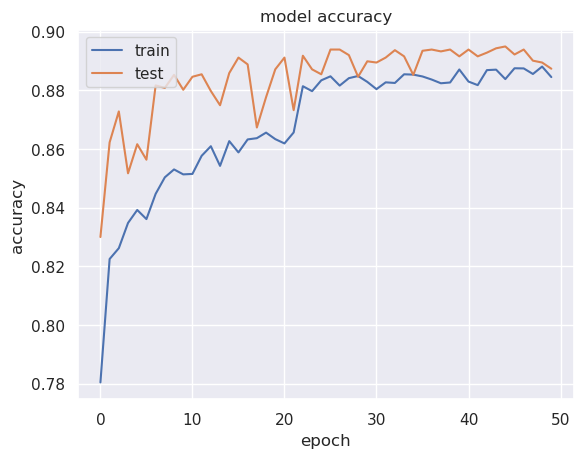

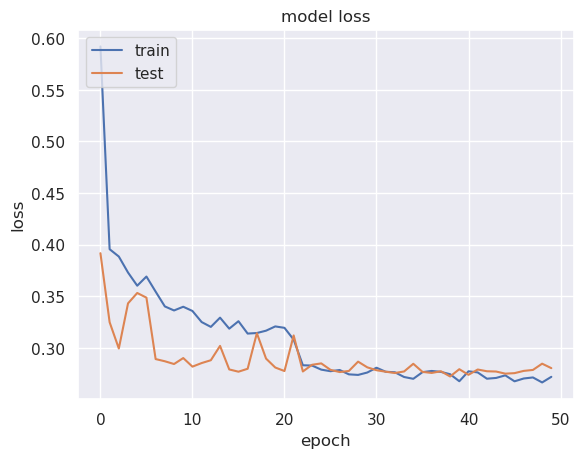

In [ ]:
# list all data in history
# print(train_history4.keys())
# summarize history for accuracy
plt.plot(train_history4.history['accuracy'])
plt.plot(train_history4.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')




plt.show()
# summarize history for loss
plt.plot(train_history4.history['loss'])
plt.plot(train_history4.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [ ]:
#Predicted label
y_pred = model4.predict(test_generator)
y_pred_label = np.argmax(y_pred,axis=1)

75/75 [==============================] - 17s 223ms/step


In [ ]:
#true labels
y_test = test_generator.labels

<AxesSubplot:>

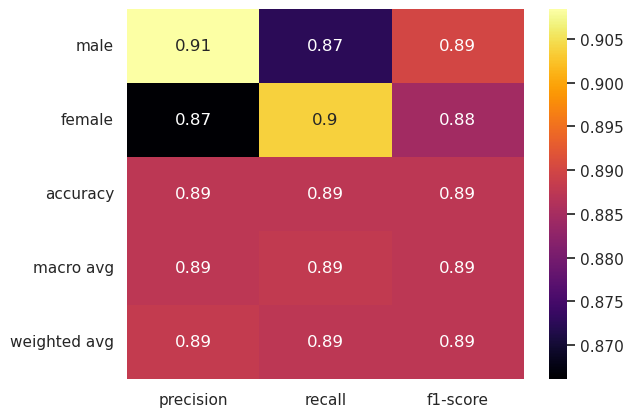

In [ ]:
class_report =  classification_report(y_test,y_pred_label,target_names=['male','female'],output_dict=True)
sns.heatmap(pd.DataFrame(class_report).iloc[:-1, :].T, annot=True,cmap='inferno')

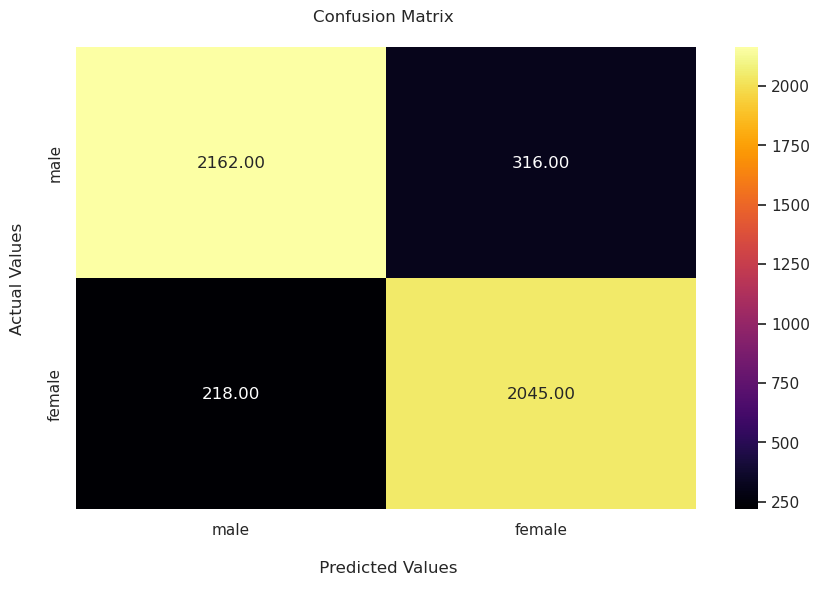

In [ ]:
conf_matrix = confusion_matrix(y_test, y_pred_label)
plt.figure(figsize=(10,6))
fx=sns.heatmap(confusion_matrix(y_test,y_pred_label), annot=True, fmt=".2f",cmap="inferno")
fx.set_title('Confusion Matrix \n')
fx.set_xlabel('\n Predicted Values\n')
fx.set_ylabel('Actual Values\n')
fx.xaxis.set_ticklabels(['male','female'])
fx.yaxis.set_ticklabels(['male','female'])
plt.show()

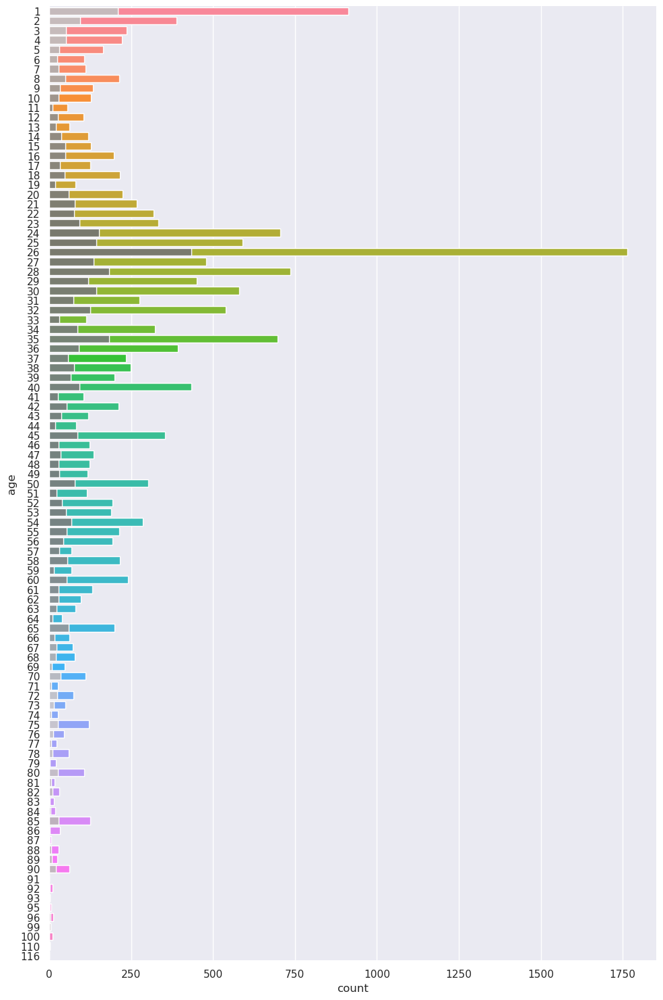

In [ ]:
value_counts_train = df.iloc[X_train.index]['age'].value_counts()
value_counts_test = df.iloc[X_test.index]['age'].value_counts()
# convert series to dataframe
value_counts_df_train = value_counts_train.reset_index()
value_counts_df_test = value_counts_test.reset_index()
# rename columns
value_counts_df_train.columns = ['age','count']
value_counts_df_test.columns = ['age','count']

plt.figure(figsize=(10,15))
sns.set(style="darkgrid")

#ax = sns.barplot(x="budget2018", y="ministere", data=budget, label="Total")
sns.set_color_codes("pastel")
sns.barplot(x='count', y='age', data=value_counts_df_train, orient='h', saturation=1.0)
sns.barplot(x='count', y='age', data=value_counts_df_test, orient='h', saturation=0.1)


sns.despine(left=True, bottom=True)

plt.tight_layout()
plt.show()

**CHECKING THE EFFECT OF COLOR AND ETHNICITY ON PREDICTION OF GENDER MODEL**

1/1 [==============================] - 0s 24ms/step


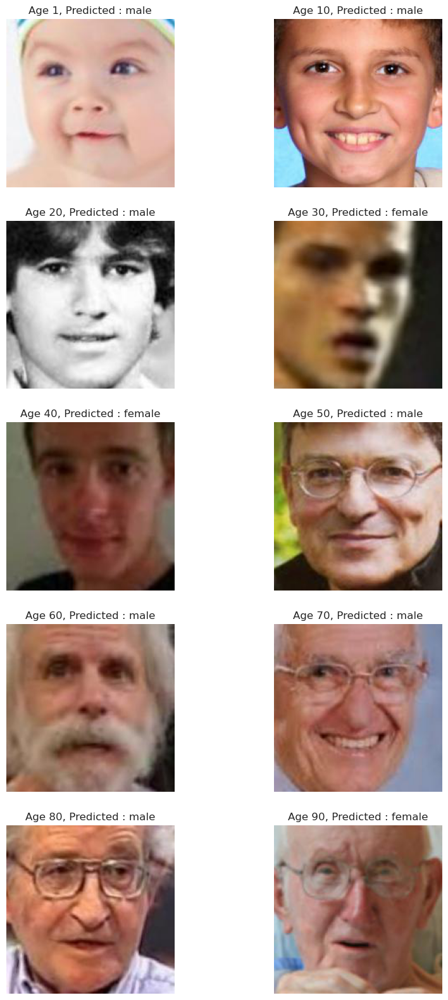

In [ ]:
# Load data
import random
data = df.iloc[X_test.index]

# Filter by gender and ethnicity
data = data[(data["gender"] == 0) & (data["ethnicity"] == 0)]
label_dict = {0:"male",1:"female"}

# Define the age groups
age_groups = [1, 10, 20, 30, 40, 50, 60, 70, 80, 90]

# Initialize the subplot
fig, axs = plt.subplots(5, 2, figsize=(10, 20))

# Loop through the age groups
for i, age in enumerate(age_groups):
    # Filter the data by age
    age_data = data[data["age"] == age]
    # Sample one image
    img_path = age_data.sample(n=1).img_name
    # Load and display the image
    img = Image.open(img_path.iloc[0])
    
    resize_img = img.resize((200,200)) #resizing the image
    rescale_img = np.array(resize_img)/255.0 #rescaling the image
    final_img = np.expand_dims(rescale_img,axis=0)
    prediction = np.argmax(model4.predict(final_img),axis=1)
    
    axs[i // 2, i % 2].imshow(img)
    axs[i // 2, i % 2].set_title(f"Age {age}, Predicted : {label_dict[int(prediction)]}")
    axs[i // 2, i % 2].axis("off")

plt.show()

**We check for a few samples, now let's check for all samples from Xtest of white males**

In [ ]:
accuracy = 0

for index, row in data.iterrows():
    
    # Load and display the image
    img = Image.open(row.img_name)
    
    resize_img = img.resize((200,200)) #resizing the image
    rescale_img = np.array(resize_img)/255.0 #rescaling the image
    final_img = np.expand_dims(rescale_img,axis=0)
    prediction = np.argmax(model4.predict(final_img,verbose=0),axis=1)
    
    accuracy += 1 if prediction == 0 else 0
    

print("Accuracy at predecting white males : ", accuracy/len(data)*100)

Accuracy at predecting white males :  88.18897637795276


In [ ]:
accuracy/len(data)*100

88.18897637795276

**Black Male Gender Prediction**

1/1 [==============================] - 0s 23ms/step


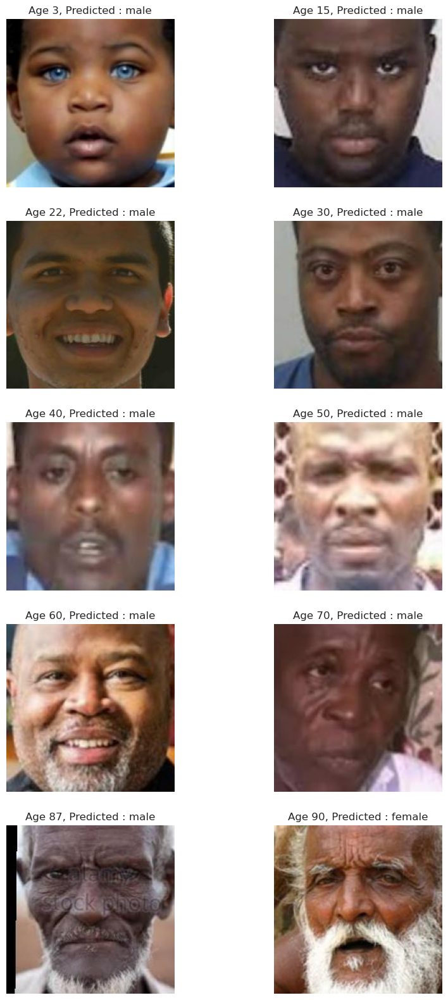

In [ ]:
# Load data
import random
data = df.iloc[X_test.index]

# Filter by gender and ethnicity
data = data[(data["gender"] == 0) & (data["ethnicity"] == 1)]
label_dict = {0:"male",1:"female"}

# Define the age groups
age_groups = [3, 15, 22, 30, 40, 50, 60, 70, 87, 90]

# Initialize the subplot
fig, axs = plt.subplots(5, 2, figsize=(10, 20))

# Loop through the age groups
for i, age in enumerate(age_groups):
    # Filter the data by age
    age_data = data[data["age"] == age]
    # Sample one image
    img_path = age_data.sample(n=1).img_name
    # Load and display the image
    img = Image.open(img_path.iloc[0])
    
    resize_img = img.resize((200,200)) #resizing the image
    rescale_img = np.array(resize_img)/255.0 #rescaling the image
    final_img = np.expand_dims(rescale_img,axis=0)
    prediction = np.argmax(model4.predict(final_img),axis=1)
    
    axs[i // 2, i % 2].imshow(img)
    axs[i // 2, i % 2].set_title(f"Age {age}, Predicted : {label_dict[int(prediction)]}")
    axs[i // 2, i % 2].axis("off")

plt.show()

**Now we find accuracy for all images of black male in test data**

In [ ]:
accuracy = 0

for index, row in data.iterrows():
    
    # Load and display the image
    img = Image.open(row.img_name)
    
    resize_img = img.resize((200,200)) #resizing the image
    rescale_img = np.array(resize_img)/255.0 #rescaling the image
    final_img = np.expand_dims(rescale_img,axis=0)
    prediction = np.argmax(model4.predict(final_img,verbose=0),axis=1)
    
    accuracy += 1 if prediction == 0 else 0
    

print("Accuracy at predecting black males : ", accuracy/len(data)*100)

Accuracy at predecting black males :  89.91228070175438


**Asian Male Gender Prediction**

1/1 [==============================] - 0s 27ms/step


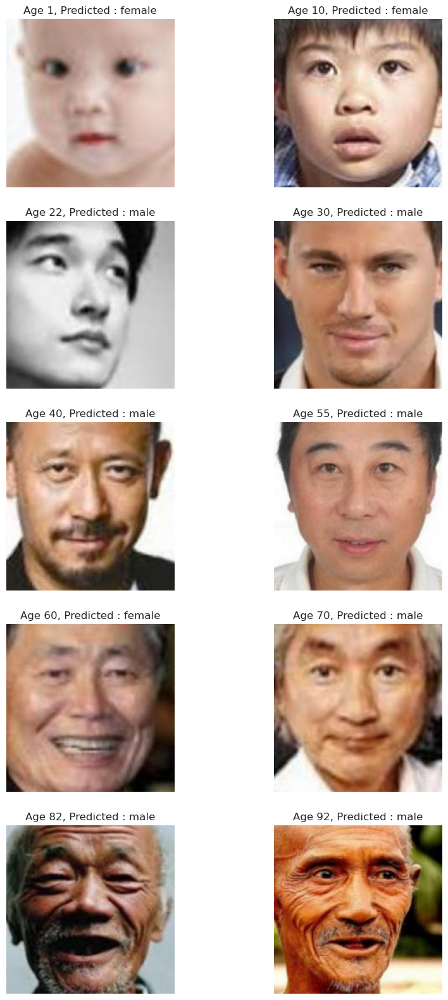

In [ ]:
# Load data
import random
data = df.iloc[X_test.index]

# Filter by gender and ethnicity
data = data[(data["gender"] == 0) & (data["ethnicity"] == 2)]
label_dict = {0:"male",1:"female"}

# Define the age groups
age_groups = [1, 10, 22, 30, 40, 55, 60, 70, 82, 92]

# Initialize the subplot
fig, axs = plt.subplots(5, 2, figsize=(10, 20))

# Loop through the age groups
for i, age in enumerate(age_groups):
    # Filter the data by age
    age_data = data[data["age"] == age]
    # Sample one image
    img_path = age_data.sample(n=1).img_name
    # Load and display the image
    img = Image.open(img_path.iloc[0])
    
    resize_img = img.resize((200,200)) #resizing the image
    rescale_img = np.array(resize_img)/255.0 #rescaling the image
    final_img = np.expand_dims(rescale_img,axis=0)
    prediction = np.argmax(model4.predict(final_img),axis=1)
    
    axs[i // 2, i % 2].imshow(img)
    axs[i // 2, i % 2].set_title(f"Age {age}, Predicted : {label_dict[int(prediction)]}")
    axs[i // 2, i % 2].axis("off")

plt.show()

In [ ]:
accuracy = 0

for index, row in data.iterrows():
    
    # Load and display the image
    img = Image.open(row.img_name)
    
    resize_img = img.resize((200,200)) #resizing the image
    rescale_img = np.array(resize_img)/255.0 #rescaling the image
    final_img = np.expand_dims(rescale_img,axis=0)
    prediction = np.argmax(model4.predict(final_img,verbose=0),axis=1)
    
    accuracy += 1 if prediction == 0 else 0
    

print("Accuracy at predecting asian males : ", accuracy/len(data)*100)

Accuracy at predecting asian males :  79.03780068728523


**White Female Gender Prediction**

1/1 [==============================] - 0s 24ms/step


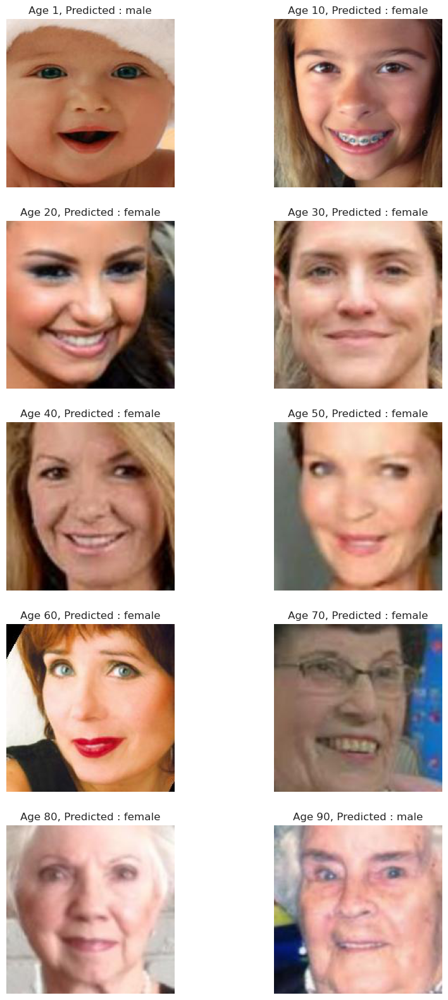

In [ ]:
# Load data
import random
data = df.iloc[X_test.index]

# Filter by gender and ethnicity
data = data[(data["gender"] == 1) & (data["ethnicity"] == 0)]
label_dict = {0:"male",1:"female"}

# Define the age groups
age_groups = [1, 10, 20, 30, 40, 50, 60, 70, 80, 90]

# Initialize the subplot
fig, axs = plt.subplots(5, 2, figsize=(10, 20))

# Loop through the age groups
for i, age in enumerate(age_groups):
    # Filter the data by age
    age_data = data[data["age"] == age]
    # Sample one image
    img_path = age_data.sample(n=1).img_name
    # Load and display the image
    img = Image.open(img_path.iloc[0])
    
    resize_img = img.resize((200,200)) #resizing the image
    rescale_img = np.array(resize_img)/255.0 #rescaling the image
    final_img = np.expand_dims(rescale_img,axis=0)
    prediction = np.argmax(model4.predict(final_img),axis=1)
    
    axs[i // 2, i % 2].imshow(img)
    axs[i // 2, i % 2].set_title(f"Age {age}, Predicted : {label_dict[int(prediction)]}")
    axs[i // 2, i % 2].axis("off")

plt.show()

In [ ]:
accuracy = 0

for index, row in data.iterrows():
    
    # Load and display the image
    img = Image.open(row.img_name)
    
    resize_img = img.resize((200,200)) #resizing the image
    rescale_img = np.array(resize_img)/255.0 #rescaling the image
    final_img = np.expand_dims(rescale_img,axis=0)
    prediction = np.argmax(model4.predict(final_img,verbose=0),axis=1)
    
    accuracy += 1 if prediction == 1 else 0
    

print("Accuracy at predecting white females : ", accuracy/len(data)*100)

Accuracy at predecting white females :  90.40348964013086


**Black Female Gender Prediction**

1/1 [==============================] - 0s 24ms/step


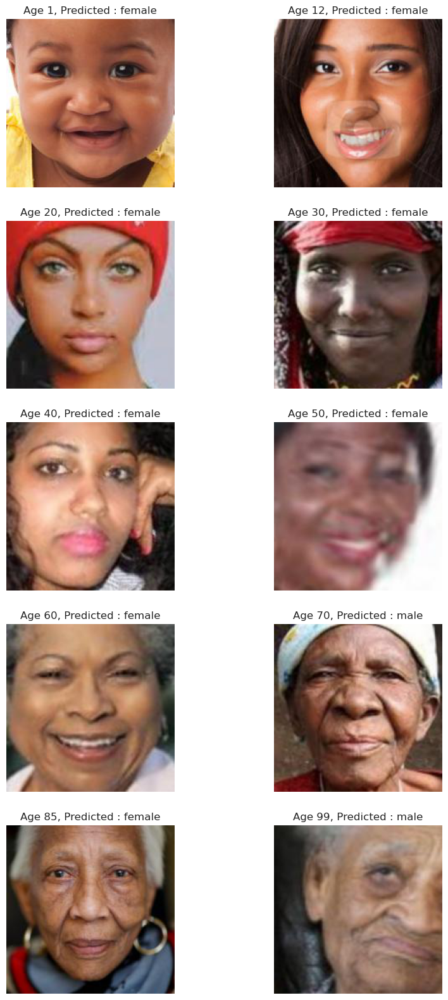

In [ ]:
# Load data
import random
data = df.iloc[X_test.index]

# Filter by gender and ethnicity
data = data[(data["gender"] == 1) & (data["ethnicity"] == 1)]
label_dict = {0:"male",1:"female"}

# Define the age groups
age_groups = [1, 12, 20, 30, 40, 50, 60, 70, 85, 99]

# Initialize the subplot
fig, axs = plt.subplots(5, 2, figsize=(10, 20))

# Loop through the age groups
for i, age in enumerate(age_groups):
    # Filter the data by age
    age_data = data[data["age"] == age]
    # Sample one image
    img_path = age_data.sample(n=1).img_name
    # Load and display the image
    img = Image.open(img_path.iloc[0])
    
    resize_img = img.resize((200,200)) #resizing the image
    rescale_img = np.array(resize_img)/255.0 #rescaling the image
    final_img = np.expand_dims(rescale_img,axis=0)
    prediction = np.argmax(model4.predict(final_img),axis=1)
    
    axs[i // 2, i % 2].imshow(img)
    axs[i // 2, i % 2].set_title(f"Age {age}, Predicted : {label_dict[int(prediction)]}")
    axs[i // 2, i % 2].axis("off")

plt.show()

In [ ]:
accuracy = 0

for index, row in data.iterrows():
    
    # Load and display the image
    img = Image.open(row.img_name)
    
    resize_img = img.resize((200,200)) #resizing the image
    rescale_img = np.array(resize_img)/255.0 #rescaling the image
    final_img = np.expand_dims(rescale_img,axis=0)
    prediction = np.argmax(model4.predict(final_img,verbose=0),axis=1)
    
    accuracy += 1 if prediction == 1 else 0
    

print("Accuracy at predecting black females : ", accuracy/len(data)*100)

Accuracy at predecting black females :  88.60465116279069


**Asian Female Gender Prediction**

1/1 [==============================] - 0s 27ms/step


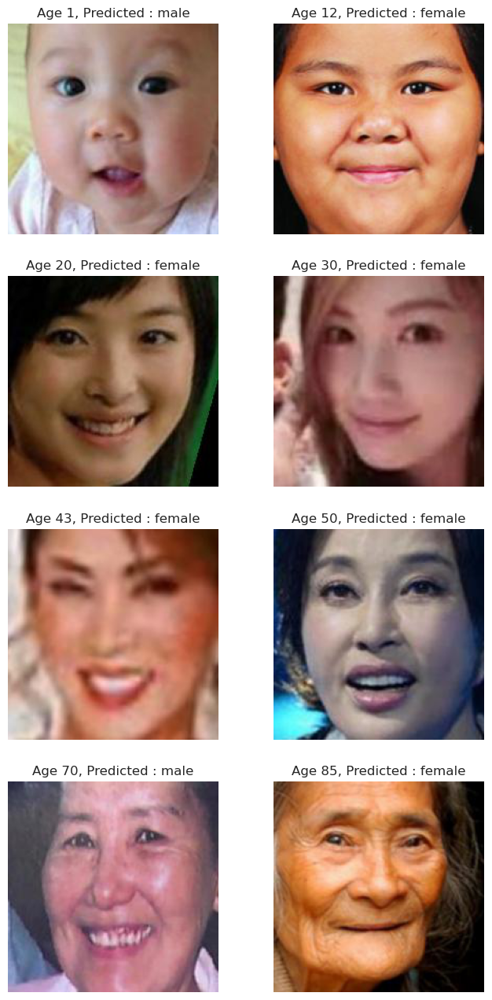

In [ ]:
# Load data
import random
data = df.iloc[X_test.index]

# Filter by gender and ethnicity
data = data[(data["gender"] == 1) & (data["ethnicity"] == 2)]
label_dict = {0:"male",1:"female"}

# Define the age groups
age_groups = [1, 12, 20, 30, 43, 50,70,85]

# Initialize the subplot
fig, axs = plt.subplots(4, 2, figsize=(8, 16))

# Loop through the age groups
for i, age in enumerate(age_groups):
    # Filter the data by age
    age_data = data[data["age"] == age]
    # Sample one image
    img_path = age_data.sample(n=1).img_name
    # Load and display the image
    img = Image.open(img_path.iloc[0])
    
    resize_img = img.resize((200,200)) #resizing the image
    rescale_img = np.array(resize_img)/255.0 #rescaling the image
    final_img = np.expand_dims(rescale_img,axis=0)
    prediction = np.argmax(model4.predict(final_img),axis=1)
    
    axs[i // 2, i % 2].imshow(img)
    axs[i // 2, i % 2].set_title(f"Age {age}, Predicted : {label_dict[int(prediction)]}")
    axs[i // 2, i % 2].axis("off")

plt.show()

In [ ]:
accuracy = 0

for index, row in data.iterrows():
    
    # Load and display the image
    img = Image.open(row.img_name)
    
    resize_img = img.resize((200,200)) #resizing the image
    rescale_img = np.array(resize_img)/255.0 #rescaling the image
    final_img = np.expand_dims(rescale_img,axis=0)
    prediction = np.argmax(model4.predict(final_img,verbose=0),axis=1)
    
    accuracy += 1 if prediction == 1 else 0
    

print("Accuracy at predicting asian females : ", accuracy/len(data)*100)

Accuracy at predecting asian females :  88.04071246819338


**AGE TRANSFER MODEL**

In [ ]:
# required libraries: Numpy, Pandas, TensorFlow, matplotlib, seaborn, sklearn
import numpy as np 
import os
import pandas as pd
import tensorflow as tf
from tensorflow.keras import layers
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn import metrics

from keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report,confusion_matrix
from keras.callbacks import ReduceLROnPlateau

from PIL import Image

from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Dropout, Flatten, Reshape, MaxPool2D,BatchNormalization
from tensorflow.keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, EarlyStopping

'''from imblearn.over_sampling import SMOTE'''

'from imblearn.over_sampling import SMOTE'

In [ ]:
# use pandas to load the CSV file
df = pd.read_csv('/kaggle/input/age-gender-and-ethnicity-face-data-csv/age_gender.csv')
df.head()

,age,ethnicity,gender,img_name,pixels
0,1,2,0,20161219203650636.jpg.chip.jpg,129 128 128 126 127 130 133 135 139 142 145 14...
1,1,2,0,20161219222752047.jpg.chip.jpg,164 74 111 168 169 171 175 182 184 188 193 199...
2,1,2,0,20161219222832191.jpg.chip.jpg,67 70 71 70 69 67 70 79 90 103 116 132 145 155...
3,1,2,0,20161220144911423.jpg.chip.jpg,193 197 198 200 199 200 202 203 204 205 208 21...
4,1,2,0,20161220144914327.jpg.chip.jpg,202 205 209 210 209 209 210 211 212 214 218 21...


In [ ]:
df['img_name'] = "/kaggle/input/utk-face-cropped/utkcropped/" + (df['age'].astype(str))+"_"+ (df['gender'].astype(str))+ "_"+ (df['ethnicity'].astype(str)) + "_" + df['img_name'] 

In [ ]:
def train_model(model, train_generator, validation_generator, epochs, name):
    path_cp = name + '_weights.hdf5'

    rlr = ReduceLROnPlateau(monitor='val_mean_squared_error', factor=0.05, patience=4, verbose=1,
                            min_delta=1e-4, min_lr=1e-4, mode='min', cooldown=1)

    ckp = ModelCheckpoint(path_cp, monitor='val_mean_squared_error', verbose=1, save_best_only=True, mode='min')

    es = EarlyStopping(monitor='val_mean_squared_error', min_delta=1e-4, patience=15, mode='min',
                       restore_best_weights=True, verbose=1)

    # Fitting the model
    history = model.fit(train_generator,
                        epochs=epochs,
                        validation_data=validation_generator,
                        verbose=1,
                        callbacks=[rlr, es, ckp])

    return history


In [ ]:
def get_generator(df_test,df_train, x_col, y_cols, sample_size=100, batch_size=128, seed=1, target_w = 100, target_h = 100):
    
    print("getting testing generators...")
    
    # use sample to fit mean and std for test set generator
    train_image_generator = ImageDataGenerator(rescale=1/255,
                                               shear_range=0.2,
                                               zoom_range=0.3,
                                               rotation_range=10,
                                             width_shift_range=0.1,
                                             height_shift_range=0.1)
                                               
    
    test_image_generator = ImageDataGenerator(rescale=1/255)
    
    train_generator = train_image_generator.flow_from_dataframe(
            dataframe=df_train,
            x_col=x_col,
            y_col=y_cols,
            class_mode="raw",
            batch_size=batch_size,
            seed=seed,
            target_size=(target_w,target_h))
    
    test_generator = test_image_generator.flow_from_dataframe(
            dataframe=df_test,
            x_col=x_col,
            y_col=y_cols,
            class_mode="raw",
            batch_size=batch_size,
            shuffle=False,
            seed=seed,
            target_size=(target_w,target_h))
    
    return train_generator,test_generator

In [ ]:
age_counts = df['age'].value_counts()

# Filter the dataframe to include only ages that occur more than once
df = df[df['age'].isin(age_counts[age_counts > 1].index)]

In [ ]:
y = df[['age']]
X = df[['img_name']]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=100, stratify=y)

In [ ]:
df_train = pd.concat([X_train,y_train],axis=1)
df_test = pd.concat([X_test,y_test],axis=1)

In [ ]:
train_generator, test_generator= get_generator(df_test,df_train,"img_name", "age")

getting testing generators...
Found 18962 validated image filenames.
Found 4741 validated image filenames.


In [ ]:
from tensorflow.keras.applications.vgg16 import VGG16

model_train = VGG16(input_shape=(100,100,3) , weights='imagenet', include_top=False)

for layer in model_train.layers:
    layer.trainable = False

x = Reshape((3*3,512))(model_train.output)
x = Flatten()(x)
x = Dense(128)(x)
x = Dropout(0.2)(x)
x = Dense(32)(x)
prediction = Dense(1)(x)

# create a model object
model_age = Model(inputs=model_train.input, outputs=prediction)

In [ ]:
model_age.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 100, 100, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 100, 100, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 100, 100, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 50, 50, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 50, 50, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 50, 50, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 25, 25, 128)       0   

In [ ]:
model_age.compile(loss='mae', optimizer = tf.optimizers.Adam(learning_rate=0.01), metrics=['mean_squared_error'])

In [ ]:
train_history_age = train_model(model_age, train_generator,test_generator, epochs = 50,name="vgg16_age")

Epoch 1/50
149/149 [==============================] - ETA: 0s - loss: 12.3103 - mean_squared_error: 306.7201
Epoch 1: val_mean_squared_error improved from inf to 166.85442, saving model to vgg16_age_weights.hdf5
149/149 [==============================] - 179s 1s/step - loss: 12.3103 - mean_squared_error: 306.7201 - val_loss: 9.6962 - val_mean_squared_error: 166.8544 - lr: 0.0100
Epoch 2/50
149/149 [==============================] - ETA: 0s - loss: 10.7807 - mean_squared_error: 199.4017
Epoch 2: val_mean_squared_error did not improve from 166.85442
149/149 [==============================] - 106s 714ms/step - loss: 10.7807 - mean_squared_error: 199.4017 - val_loss: 9.9165 - val_mean_squared_error: 171.8185 - lr: 0.0100
Epoch 3/50
149/149 [==============================] - ETA: 0s - loss: 10.5355 - mean_squared_error: 192.0931
Epoch 3: val_mean_squared_error improved from 166.85442 to 163.58873, saving model to vgg16_age_weights.hdf5
149/149 [==============================] - 106s 711ms/s

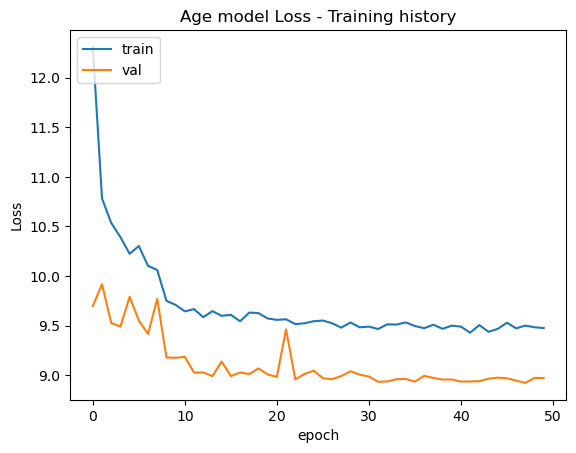

In [ ]:
plt.plot(train_history_age.history['loss'])
plt.plot(train_history_age.history['val_loss'])
plt.title('Age model Loss - Training history')
plt.ylabel('Loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()#
         

In [ ]:
model_age.evaluate(test_generator)

38/38 [==============================] - 11s 285ms/step - loss: 8.9697 - mean_squared_error: 141.0405


[8.96972370147705, 141.04052734375]

**White Male Age Prediction**

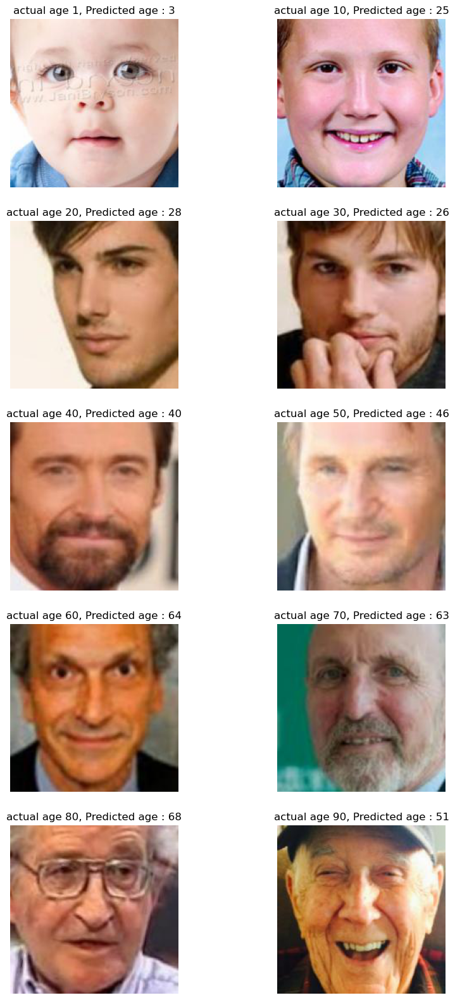

MAE for white males :  94.72029447555542


In [ ]:
# Load data
import random

mse = 0

data = df.iloc[X_test.index]

# Filter by gender and ethnicity
data = data[(data["gender"] == 0) & (data["ethnicity"] == 0)]

# Define the age groups
age_groups = [1, 10, 20, 30, 40, 50, 60, 70, 80, 90]

# Initialize the subplot
fig, axs = plt.subplots(5, 2, figsize=(10, 20))

# Loop through the age groups
for i, age in enumerate(age_groups):
    # Filter the data by age
    age_data = data[data["age"] == age]
    # Sample one image
    img_path = age_data.sample(n=1).img_name
    # Load and display the image
    img = Image.open(img_path.iloc[0])
    
    resize_img = img.resize((100,100)) #resizing the image
    rescale_img = np.array(resize_img)/255.0 #rescaling the image
    final_img = np.expand_dims(rescale_img,axis=0)
    prediction = model_age.predict(final_img,verbose=0)
    
    axs[i // 2, i % 2].imshow(img)
    axs[i // 2, i % 2].set_title(f"actual age {age}, Predicted age : {int(prediction)}")
    axs[i // 2, i % 2].axis("off")
    
    mse+=model_age.evaluate(final_img,np.array([age]),verbose=0)[0]

plt.show()

print("MAE for white males : ", mse)

**Black Male Age Prediction**

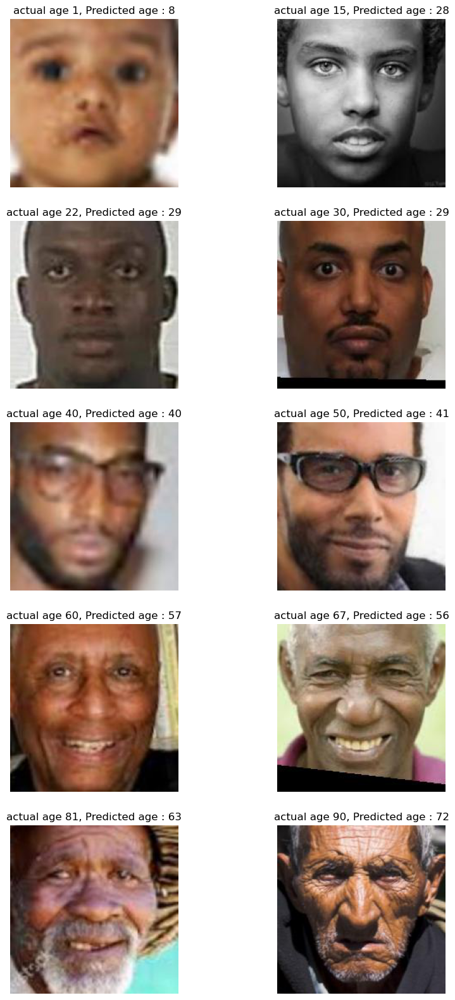

MAE for black males :  84.49748706817627


In [ ]:
# Load data
import random

mse = 0

data = df.iloc[X_test.index]

# Filter by gender and ethnicity
data = data[(data["gender"] == 0) & (data["ethnicity"] == 1)]

# Define the age groups
age_groups = [1, 15, 22, 30, 40, 50, 60,67, 81, 90]

# Initialize the subplot
fig, axs = plt.subplots(5, 2, figsize=(10, 20))

# Loop through the age groups
for i, age in enumerate(age_groups):
    # Filter the data by age
    age_data = data[data["age"] == age]
    # Sample one image
    img_path = age_data.sample(n=1).img_name
    # Load and display the image
    img = Image.open(img_path.iloc[0])
    
    resize_img = img.resize((100,100)) #resizing the image
    rescale_img = np.array(resize_img)/255.0 #rescaling the image
    final_img = np.expand_dims(rescale_img,axis=0)
    prediction = model_age.predict(final_img,verbose=0)
    
    axs[i // 2, i % 2].imshow(img)
    axs[i // 2, i % 2].set_title(f"actual age {age}, Predicted age : {int(prediction)}")
    axs[i // 2, i % 2].axis("off")
    
    mse+=model_age.evaluate(final_img,np.array([age]),verbose=0)[0]

plt.show()

print("MAE for black males : ", mse)

**Asian Male Age Prediction**

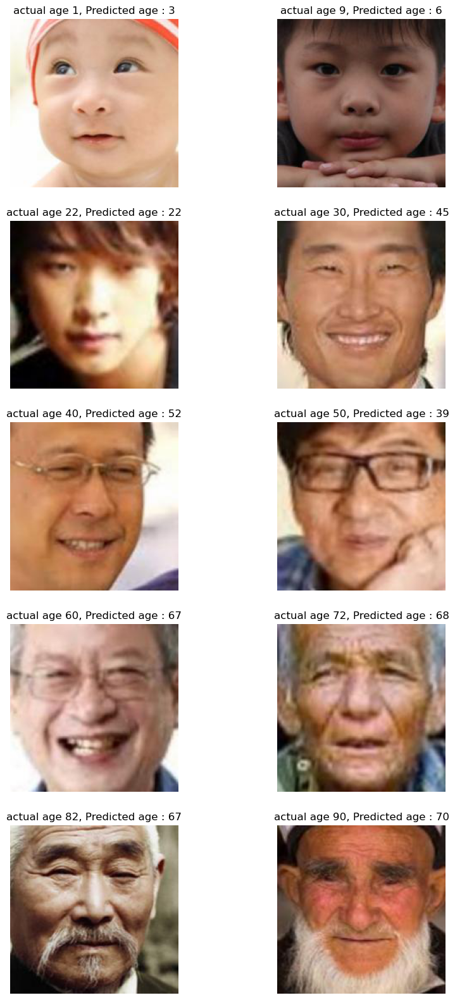

MAE for black males :  89.57943344116211


In [ ]:
# Load data
import random

mse = 0

data = df.iloc[X_test.index]

# Filter by gender and ethnicity
data = data[(data["gender"] == 0) & (data["ethnicity"] == 2)]

# Define the age groups
age_groups = [1, 9, 22, 30, 40, 50, 60, 72, 82, 90]

# Initialize the subplot
fig, axs = plt.subplots(5, 2, figsize=(10, 20))

# Loop through the age groups
for i, age in enumerate(age_groups):
    # Filter the data by age
    age_data = data[data["age"] == age]
    # Sample one image
    img_path = age_data.sample(n=1).img_name
    # Load and display the image
    img = Image.open(img_path.iloc[0])
    
    resize_img = img.resize((100,100)) #resizing the image
    rescale_img = np.array(resize_img)/255.0 #rescaling the image
    final_img = np.expand_dims(rescale_img,axis=0)
    prediction = model_age.predict(final_img,verbose=0)
    
    axs[i // 2, i % 2].imshow(img)
    axs[i // 2, i % 2].set_title(f"actual age {age}, Predicted age : {int(prediction)}")
    axs[i // 2, i % 2].axis("off")
    
    mse+=model_age.evaluate(final_img,np.array([age]),verbose=0)[0]

plt.show()

print("MAE for black males : ", mse)

**White Female Age Prediction**

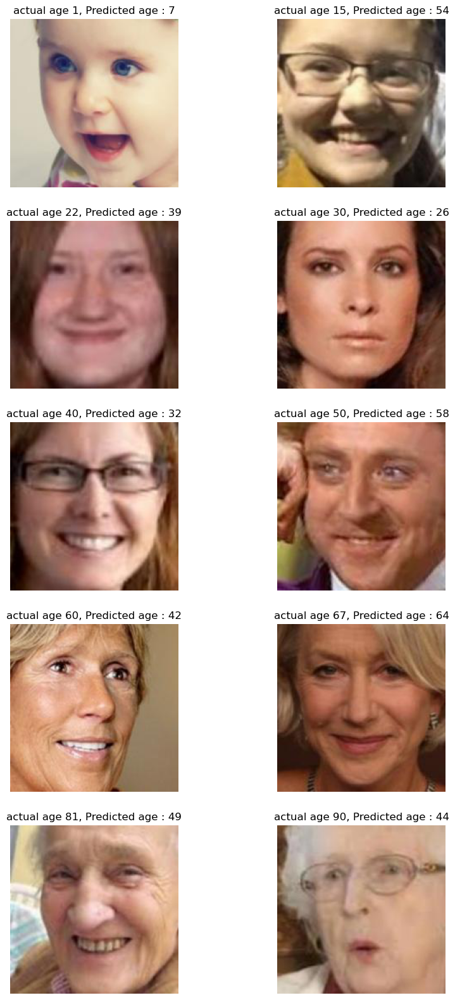

MAE for black males :  181.0004620552063


In [ ]:
# Load data
import random

mse = 0

data = df.iloc[X_test.index]

# Filter by gender and ethnicity
data = data[(data["gender"] == 1) & (data["ethnicity"] == 0)]

# Define the age groups
age_groups = [1, 15, 22, 30, 40, 50, 60,67, 81, 90]

# Initialize the subplot
fig, axs = plt.subplots(5, 2, figsize=(10, 20))

# Loop through the age groups
for i, age in enumerate(age_groups):
    # Filter the data by age
    age_data = data[data["age"] == age]
    # Sample one image
    img_path = age_data.sample(n=1).img_name
    # Load and display the image
    img = Image.open(img_path.iloc[0])
    
    resize_img = img.resize((100,100)) #resizing the image
    rescale_img = np.array(resize_img)/255.0 #rescaling the image
    final_img = np.expand_dims(rescale_img,axis=0)
    prediction = model_age.predict(final_img,verbose=0)
    
    axs[i // 2, i % 2].imshow(img)
    axs[i // 2, i % 2].set_title(f"actual age {age}, Predicted age : {int(prediction)}")
    axs[i // 2, i % 2].axis("off")
    
    mse+=model_age.evaluate(final_img,np.array([age]),verbose=0)[0]

plt.show()

print("MAE for black males : ", mse)

**Black Female Age Prediction**

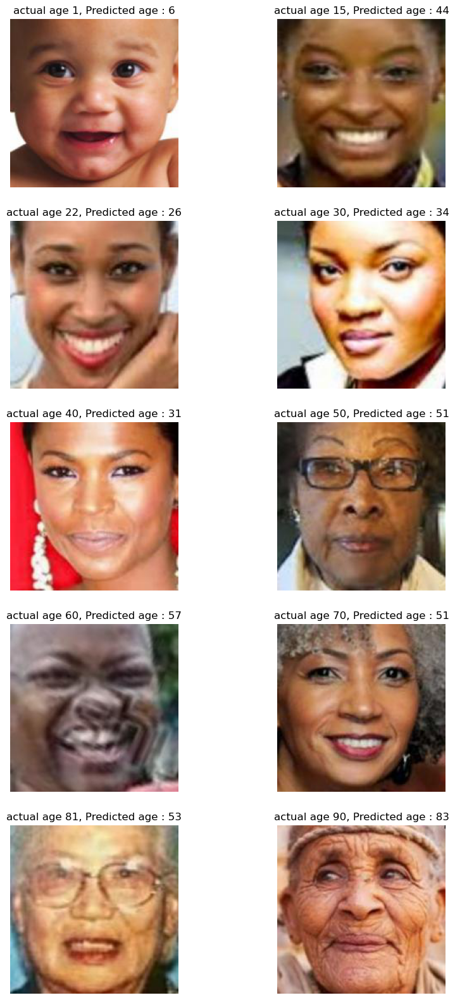

MAE for black males :  108.77025032043457


In [ ]:
# Load data
import random

mse = 0

data = df.iloc[X_test.index]

# Filter by gender and ethnicity
data = data[(data["gender"] == 1) & (data["ethnicity"] == 1)]

# Define the age groups
age_groups = [1, 15, 22, 30, 40, 50, 60, 70, 81, 90]

# Initialize the subplot
fig, axs = plt.subplots(5, 2, figsize=(10, 20))

# Loop through the age groups
for i, age in enumerate(age_groups):
    # Filter the data by age
    age_data = data[data["age"] == age]
    # Sample one image
    img_path = age_data.sample(n=1).img_name
    # Load and display the image
    img = Image.open(img_path.iloc[0])
    
    resize_img = img.resize((100,100)) #resizing the image
    rescale_img = np.array(resize_img)/255.0 #rescaling the image
    final_img = np.expand_dims(rescale_img,axis=0)
    prediction = model_age.predict(final_img,verbose=0)
    
    axs[i // 2, i % 2].imshow(img)
    axs[i // 2, i % 2].set_title(f"actual age {age}, Predicted age : {int(prediction)}")
    axs[i // 2, i % 2].axis("off")
    
    mse+=model_age.evaluate(final_img,np.array([age]),verbose=0)[0]

plt.show()

print("MAE for black males : ", mse)

**Asian Female Age Prediction**

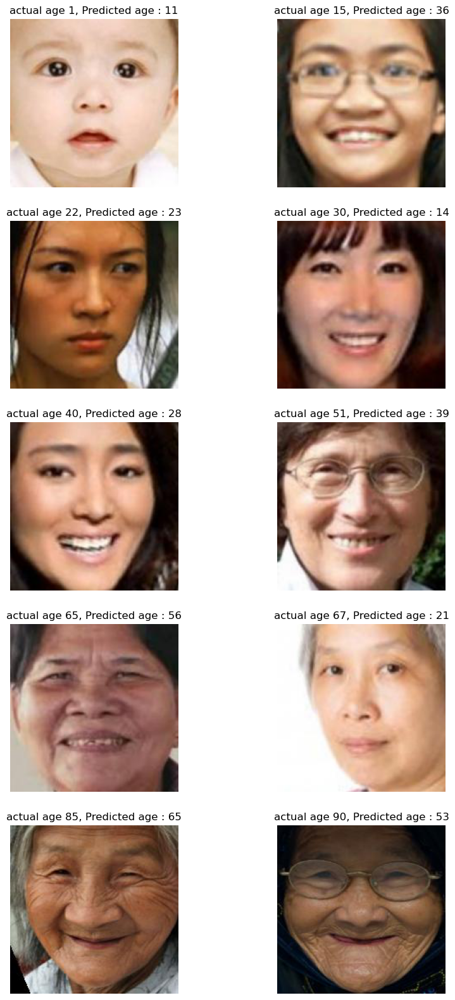

MAE for black males :  181.74841594696045


In [ ]:
# Load data
import random

mse = 0

data = df.iloc[X_test.index]

# Filter by gender and ethnicity
data = data[(data["gender"] == 1) & (data["ethnicity"] == 2)]

# Define the age groups
age_groups = [1, 15, 22, 30, 40, 51, 65, 67, 85, 90]

# Initialize the subplot
fig, axs = plt.subplots(5, 2, figsize=(10, 20))

# Loop through the age groups
for i, age in enumerate(age_groups):
    # Filter the data by age
    age_data = data[data["age"] == age]
    # Sample one image
    img_path = age_data.sample(n=1).img_name
    # Load and display the image
    img = Image.open(img_path.iloc[0])
    
    resize_img = img.resize((100,100)) #resizing the image
    rescale_img = np.array(resize_img)/255.0 #rescaling the image
    final_img = np.expand_dims(rescale_img,axis=0)
    prediction = model_age.predict(final_img,verbose=0)
    
    axs[i // 2, i % 2].imshow(img)
    axs[i // 2, i % 2].set_title(f"actual age {age}, Predicted age : {int(prediction)}")
    axs[i // 2, i % 2].axis("off")
    
    mse+=model_age.evaluate(final_img,np.array([age]),verbose=0)[0]

plt.show()

print("MAE for black males : ", mse)

**ETHNICITY TRANSFER MODEL**

In [ ]:
y = df[['ethnicity']]
X = df[['img_name']]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=100, stratify=y)


In [ ]:
df_train = pd.concat([X_train,y_train],axis=1)
df_test = pd.concat([X_test,y_test],axis=1)

In [ ]:
train_generator, test_generator= get_generator(df_test,df_train,"img_name", "ethnicity")

getting testing generators...
Found 18964 validated image filenames.
Found 4741 validated image filenames.


In [ ]:
from tensorflow.keras.applications.vgg16 import VGG16

model_train = VGG16(input_shape=(150,150,3) , weights='imagenet', include_top=False)

for layer in model_train.layers:
    layer.trainable = False

x = Reshape((4*4,512))(model_train.output)
x = Flatten()(x)
x = Dense(128)(x)
x = Dropout(0.2)(x)
x = Dense(32)(x)
prediction = Dense(5, activation='softmax')(x)

# create a model object
model_eth = Model(inputs=model_train.input, outputs=prediction)

In [ ]:
model_eth.compile(optimizer = tf.optimizers.Adam(learning_rate=0.01) , loss = 'sparse_categorical_crossentropy' , metrics = ['accuracy'])

In [ ]:
train_history_eth = train_model(model_eth, train_generator,test_generator, epochs = 50,name="vgg16_ethnicity")

Epoch 1/50
149/149 [==============================] - ETA: 0s - loss: 7.1381 - accuracy: 0.5147
Epoch 1: val_loss improved from inf to 0.97748, saving model to vgg16_ethnicity_weights.hdf5
149/149 [==============================] - 148s 983ms/step - loss: 7.1381 - accuracy: 0.5147 - val_loss: 0.9775 - val_accuracy: 0.6343 - lr: 0.0100
Epoch 2/50
149/149 [==============================] - ETA: 0s - loss: 0.9906 - accuracy: 0.6333
Epoch 2: val_loss improved from 0.97748 to 0.89214, saving model to vgg16_ethnicity_weights.hdf5
149/149 [==============================] - 146s 982ms/step - loss: 0.9906 - accuracy: 0.6333 - val_loss: 0.8921 - val_accuracy: 0.6722 - lr: 0.0100
Epoch 3/50
149/149 [==============================] - ETA: 0s - loss: 0.9416 - accuracy: 0.6532
Epoch 3: val_loss improved from 0.89214 to 0.85199, saving model to vgg16_ethnicity_weights.hdf5
149/149 [==============================] - 147s 985ms/step - loss: 0.9416 - accuracy: 0.6532 - val_loss: 0.8520 - val_accuracy: 0

In [ ]:
model_eth.evaluate(test_generator)

38/38 [==============================] - 12s 298ms/step - loss: 0.7541 - accuracy: 0.7374


[0.7541167140007019, 0.7373971939086914]

In [ ]:
import tensorflow as tf

#Saving the model
tf.keras.models.save_model(model_eth,"vgg16_model_ethnicity.h5")

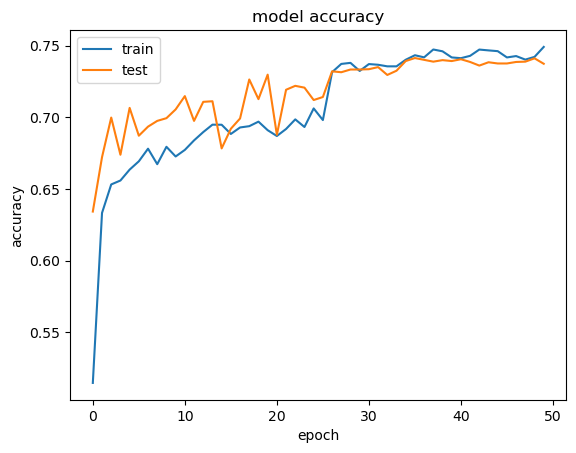

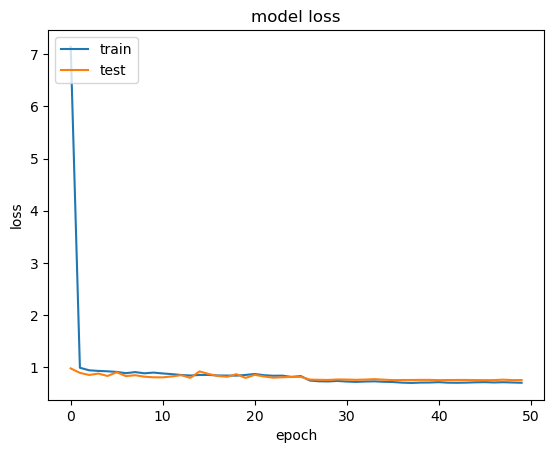

In [ ]:
# list all data in history
# print(train_history4.keys())
# summarize history for accuracy
plt.plot(train_history_eth.history['accuracy'])
plt.plot(train_history_eth.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')




plt.show()
# summarize history for loss
plt.plot(train_history_eth.history['loss'])
plt.plot(train_history_eth.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [ ]:
#Predicted label
y_pred = model_eth.predict(test_generator)
y_pred_label = np.argmax(y_pred,axis=1)

38/38 [==============================] - 12s 312ms/step


In [ ]:
#true labels
y_test = test_generator.labels

<AxesSubplot:>

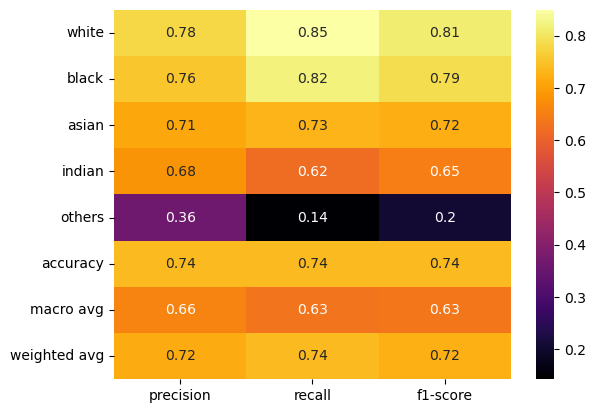

In [ ]:
class_report =  classification_report(y_test,y_pred_label,target_names=['white','black','asian','indian','others'],output_dict=True)
sns.heatmap(pd.DataFrame(class_report).iloc[:-1, :].T, annot=True,cmap='inferno')

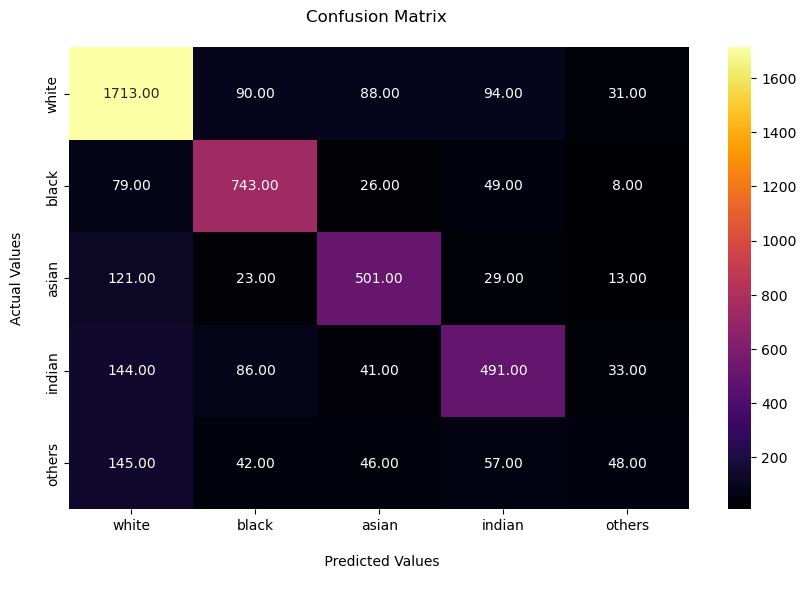

In [ ]:
conf_matrix = confusion_matrix(y_test, y_pred_label)
plt.figure(figsize=(10,6))
fx=sns.heatmap(confusion_matrix(y_test,y_pred_label), annot=True, fmt=".2f",cmap="inferno")
fx.set_title('Confusion Matrix \n')
fx.set_xlabel('\n Predicted Values\n')
fx.set_ylabel('Actual Values\n')
fx.xaxis.set_ticklabels(['white','black','asian','indian','others'])
fx.yaxis.set_ticklabels(['white','black','asian','indian','others'])
plt.show()

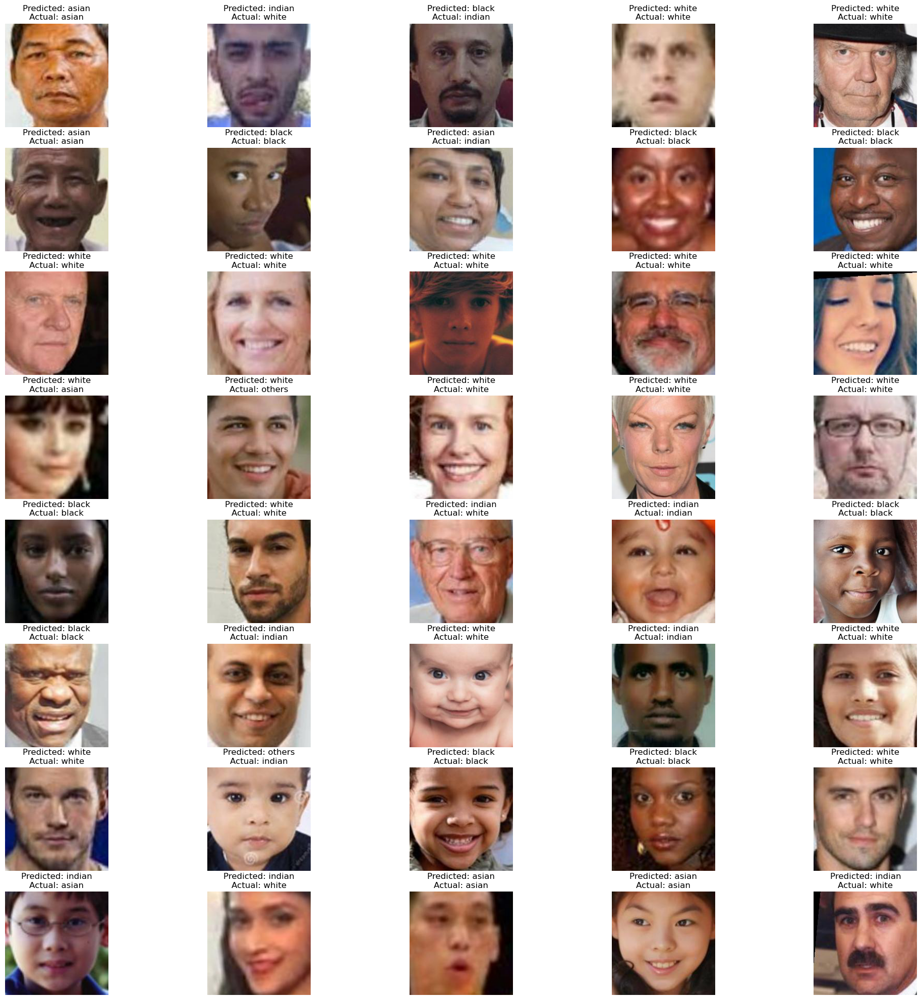

In [ ]:
# Load data
import random
data = df.iloc[X_test.index].reset_index(drop=True)

# Define the number of images to display
num_images = 40


label_dict = {0:"white",1:"black",2:"asian", 3 : "indian", 4: "others"}

# Randomly select 40 images from the X_test dataset
random_indices = random.sample(range(len(X_test)), num_images)
images = data.iloc[random_indices]['img_name']
labels = data.iloc[random_indices]['ethnicity']


# Initialize the subplot
fig, axs = plt.subplots(8, 5, figsize=(25,25))

# Loop through the images
for i, (img, label) in enumerate(zip(images, labels)):
    
    img = Image.open(img)
    resize_img = img.resize((150, 150)) #resizing the image
    rescale_img = np.array(resize_img) / 255.0 #rescaling the image
    final_img = np.expand_dims(rescale_img, axis=0)
    prediction = np.argmax(model_eth.predict(final_img,verbose=0), axis=1)
    
    # Determine the subplot index
    row = i // 5
    col = i % 5
    
    axs[row, col].imshow(img)
    axs[row, col].set_title(f"Predicted: {label_dict[int(prediction)]}\nActual: {label_dict[int(label)]}")
    axs[row, col].axis("off")

plt.show()
